# A cognitive breadth analysis of twitter users diagnosed with bipolar disorder 

## Introduction

## Method

## Exploratory Data Analysis

In [137]:
# read full data 
import pandas as pd 

# read data 
bipolar_data = pd.read_pickle("../data/processed/bipolar_data.pkl")
control_data = pd.read_pickle("../data/processed/control_data.pkl")

# columns are the same check 
control_data.columns == bipolar_data.columns

# merge data 
df = pd.concat([control_data, bipolar_data],ignore_index=True)

# set color for bipolar and control group 
cc = '#5bd1d7'
bc = '#ff502f'

In [138]:
# simple number of tweets per group per person 
import plotly.plotly as py
import plotly.graph_objs as go

init_notebook_mode(connected=True)

df_count = df.groupby(['id','is_control']).count().groupby('is_control').mean()

fig = [go.Bar(
            x=['Bipolar Group', 'Control Group'],
            y=[df_count.iloc[0][0], df_count.iloc[1][0]],
            marker=dict(
            color=[bc,cc]),
)]

iplot(fig)

In [153]:
import scipy.stats as stats
user_count = df.groupby(['id','is_control'], as_index=False).count()
bipolar_count = user_count[user_count['is_control'] == 0]['full_text']
control_count = user_count[user_count['is_control'] == 1]['full_text']

t2, p2 = stats.ttest_ind(bipolar_count,control_count)
print("t = " + str(t2))
print("p = " + str(p2))

t = -2.2615091466156936
p = 0.023768531458239865


### There is only a  small but significant difference in the average amount of tweets per User in each group. 

In [64]:
import plotly.plotly as py
import plotly.graph_objs as go
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

df = df.reset_index().set_index('created_at')
grouper = df.groupby([pd.Grouper(freq='M'),'is_control'])

df_monthly = grouper['full_text'].count().unstack('is_control').fillna(0)

init_notebook_mode(connected=True)

trace_control = go.Scatter(
                x=df_monthly.index,
                y=df_monthly[1],
                name = "Control",
                line = dict(color = cc),
                opacity = 0.8)

trace_bipolar = go.Scatter(
                x=df_monthly.index,
                y=df_monthly[0],
                name = "Bipolar",
                line = dict(color = bc),
                opacity = 0.8)

data = [trace_control,trace_bipolar]

layout = dict(
    title = "Monthly amount of Tweets per Group",
    xaxis = dict(
        range = ['2009-07-01','2019-03-31'])
)

fig = dict(data=data, layout=layout)
iplot(fig)

### Most persons in the bipolar group only started using twitter recently.

## Getting Word Embeddings - Word2Vec

## From Word to Document Embeddings

## Cluster Analysis - PCA 

In [65]:
import pandas as pd
# read resampled data 
df = pd.read_pickle("../data/processed/pca_transformed.pkl")

In [66]:
import plotly.plotly as py
import plotly.graph_objs as go
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

init_notebook_mode(connected=True)

# take random sample 
df = df.sample(10000)

trace_control = go.Scatter(
    x = df[0][df['is_control'] == 1],
    y = df[1][df['is_control'] == 1],
    name = 'Control',
    mode = 'markers',
    marker = dict(
        size = 10,
        color = cc,
        line = dict(
            width = 2,
            color = 'rgb(0, 0, 0)'
        )
    ),
    text= df['full_text'][df['is_control'] == 1]) # change to full text 


trace_bipolar = go.Scatter(
    x = df[0][df['is_control'] == 0],
    y = df[1][df['is_control'] == 0],
    name = 'Bipolar',
    mode = 'markers',
    marker = dict(
        size = 10,
        color = bc,
        line = dict(
            width = 2,
        )
    ),
    text= df['full_text'][df['is_control'] == 0]) # change to full text 


data = [trace_control, trace_bipolar]

layout= go.Layout(
    title= 'PCA of Document Vectors',
    hovermode= 'closest',
    xaxis= dict(
        title= 'Dimension 1',
        ticklen= 5,
        zeroline= False,
        gridwidth= 2,
    ),
    yaxis=dict(
        title= 'Dimension 2',
        ticklen= 5,
        gridwidth= 2,
    ),
    showlegend= False
)
fig= dict(data=data, layout=layout)
iplot(fig)

### There seems to be no or little difference in document representations for the groups. 

## Cosine Similarity over Time 

In [147]:
import pandas as pd
from datetime import datetime

# read resampled data 
df = pd.read_pickle("../data/processed/df_resampled.pkl")

# how many missing 
print('Out of {} there are {} missing observations ... '.format(len(df), df['cosine_similarity_week'].isnull().sum()))
print('Out of {} persons there are  {} with fewer than 12 weeks of activity  ... '.format(df['id'].nunique(), sum(df['id'].value_counts() < 24)))

Out of 478010 there are 132136 missing observations ... 
Out of 5246 persons there are  1208 with fewer than 12 weeks of activity  ... 


Since there are a lot of missing observations ( meaning twitter users with only one tweet per week), I will use a monthly timeframe.

In [70]:
import pandas as pd
from datetime import datetime

# read resampled data 
df = pd.read_pickle("../data/processed/df_resampled_m.pkl")

# how many missing 
print('Out of {} there are {} missing observations ... '.format(len(df), df['cosine_similarity_monthly'].isnull().sum()))
print('Out of {} persons there are  {} with fewer than 12 weeks of activity  ... '.format(df['id'].nunique(), sum(df['id'].value_counts() < 24)))

Out of 132100 there are 22732 missing observations ... 
Out of 5224 persons there are  2855 with fewer than 12 weeks of activity  ... 


In [71]:
# filling the NaN values with there respective mean? 
#df["cosine_similarity_week"] = df.groupby("id").transform(lambda x: x.fillna(x.mean()))

# excluding the values 
df = df.dropna()

# averaging the cosine similarity 
df = df.groupby(['date', 'is_control'],as_index=False).mean()

In [72]:
import plotly.plotly as py
import plotly.graph_objs as go
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

init_notebook_mode(connected=True)

trace_control = go.Scatter(
                x=df['date'][df['is_control'] == 1],
                y=df['cosine_similarity_monthly'][df['is_control'] == 1],
                name = "Control",
                line = dict(color = cc),
                opacity = 0.8)

trace_bipolar = go.Scatter(
                x=df['date'][df['is_control'] == 0],
                y=df['cosine_similarity_monthly'][df['is_control'] == 0],
                name = "Bipolar",
                line = dict(color = bc),
                opacity = 0.8)

data = [trace_control,trace_bipolar]

layout = dict(
    title = "Cosine Similarity over time",
    xaxis = dict(
        range = ['2014-01-01','2019-03-31']),
    yaxis = dict(
        range = [0.6,0.8])
)

fig = dict(data=data, layout=layout)
iplot(fig)

### However, monthly cosine similarity is higher in the bipolar group at all times. 

### Now I will take a closer look at the monthly cosine similarity distribution and look for outliers

In [73]:
# violin plots number of tweets per person per group over time (monthly)
import plotly.plotly as py
import plotly.graph_objs as go

init_notebook_mode(connected=True)

# read resampled data 
df = pd.read_pickle("../data/processed/df_resampled_m.pkl")
df = df.dropna()

column_names = pd.to_datetime(df['date'].unique()) # our dates converted to pandas 
 
plot_data = []
showLegend = [True]
showLegend.extend([False] * (len(column_names)-1))

for i in range(0,len(column_names)):
    bipolar = {
                "type": 'violin',
                "x": [column_names[i]] * len(df[(df['date'] == column_names[i]) & (df['is_control'] == 0)]), # how many entries 
                "y": df[(df['date'] == column_names[i]) & (df['is_control'] == 0)]['cosine_similarity_monthly'], # the data 
                "legendgroup": 'bipolar',
                "scalegroup": 'bipolar',
                "name": 'bipolar',
                "side": 'negative',
                "box": {
                    "visible": True
                },
                "line": {
                    "color": bc
                },

            "showlegend": showLegend[i-1],

        }
    plot_data.append(bipolar)
    control = {
                "type": 'violin',
                "x": [column_names[i]] * len(df[(df['date'] == column_names[i]) & (df['is_control'] == 1)]), # how many entries 
                "y": df[(df['date'] == column_names[i]) & (df['is_control'] == 1)]['cosine_similarity_monthly'], # the data 
                "legendgroup": 'control',
                "scalegroup": 'control',
                "name": 'control',
                "side": 'positive',
                "box": {
                    "visible": True
                },
                "line": {
                    "color": cc
                },           
            "showlegend": showLegend[i-1],
        }
    plot_data.append(control)


    fig = {
        "data": plot_data,
        "layout" : {
            "title": "Distribution of monthly cosine similarity",
            "yaxis": {
                "zeroline": False,
            },
            "xaxis" : dict(range = ['2018-03-01','2019-03-31']),
            
            
            #"violingap": 0,
            #"violingroupgap": 0,
            "violinmode": "overlay"
        }
    }

iplot(fig)



### It does not look like the distribution is heavily skewed for one group, although there are some outliers in the control group. 

## Time-Series Decomposition

In [84]:
from statsmodels.tsa.seasonal import seasonal_decompose
from matplotlib import pyplot
df = pd.read_pickle("../data/processed/df_resampled_m.pkl")
df = df.dropna()

In [120]:
# let's have a look at the bipolar series and prepare it 
df['datetime'] = pd.to_datetime(df['date'])
df = df.set_index('datetime')
df_mean = df.groupby(['date', 'is_control'],as_index=False).mean()
series = df['cosine_similarity_monthly'][df['is_control'] == 0]

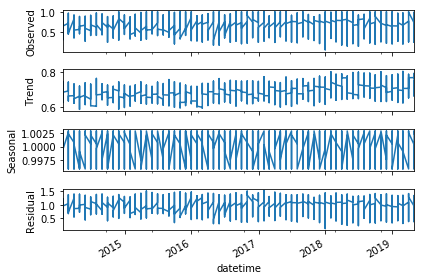

In [121]:
model1 = seasonal_decompose(series, model='additive', freq=12)
model1.plot()
pyplot.show()

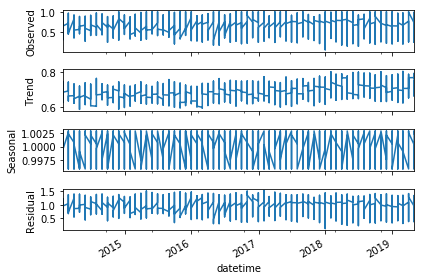

In [122]:
model2 = seasonal_decompose(series, model='multiplicative', freq=12)
model2.plot()
pyplot.show()

/Users/lukasmalik/anaconda3/envs/myenv/lib/python3.6/site-packages/numpy/lib/histograms.py:754: RuntimeWarning:

invalid value encountered in greater_equal

/Users/lukasmalik/anaconda3/envs/myenv/lib/python3.6/site-packages/numpy/lib/histograms.py:755: RuntimeWarning:

invalid value encountered in less_equal



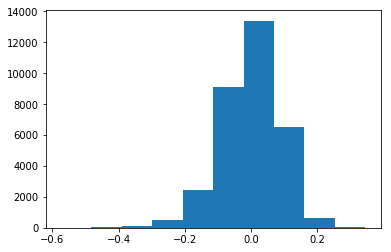

In [126]:
pyplot.hist(model1.resid)
pyplot.show()

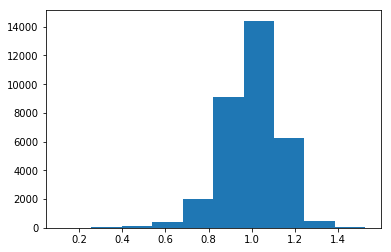

In [127]:
pyplot.hist(model2.resid)
pyplot.show()

In [131]:
from scipy import stats

print(stats.normaltest(model1.resid,nan_policy = 'omit'))
print(stats.normaltest(model2.resid,nan_policy = 'omit'))

print(stats.shapiro(model1.resid.dropna()))
print(stats.shapiro(model2.resid.dropna()))

NormaltestResult(statistic=2344.639726381455, pvalue=0.0)
NormaltestResult(statistic=2678.4725392798446, pvalue=0.0)
(0.9831550121307373, 0.0)
(0.9811670780181885, 0.0)


/Users/lukasmalik/anaconda3/envs/myenv/lib/python3.6/site-packages/scipy/stats/morestats.py:1653: UserWarning:

p-value may not be accurate for N > 5000.

/Users/lukasmalik/anaconda3/envs/myenv/lib/python3.6/site-packages/scipy/stats/morestats.py:1653: UserWarning:

p-value may not be accurate for N > 5000.



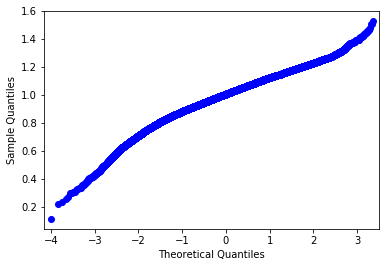

In [136]:
import scipy.stats as stats
import statsmodels.api as sm
from matplotlib import pyplot as plt

fig = sm.qqplot(model2.resid)
plt.show()

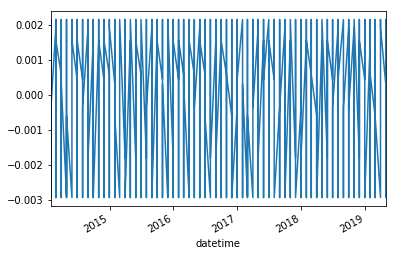

In [155]:
model1.seasonal.plot()
pyplot.show()